# BeamRider - DDQN

## Instalación e importación de librerías

In [ ]:
!pip install stable_baselines3 # DQN
!pip install ale-py
!pip install "gymnasium[atari,accept-rom-license]" stable-baselines3 autorom renderlab -q
!AutoROM --accept-license
!pip install renderlab

# Librerías y utilidades RL
import stable_baselines3
from stable_baselines3 import DQN
from stable_baselines3.common.logger import configure
from stable_baselines3.common.logger import Logger, CSVOutputFormat, HumanOutputFormat
from stable_baselines3.common.evaluation import evaluate_policy
import gymnasium
import renderlab

import ale_py
from gymnasium.wrappers import TimeLimit
from stable_baselines3.common.env_util import make_atari_env
from stable_baselines3.common.vec_env import DummyVecEnv, VecFrameStack, VecVideoRecorder
from collections import deque
import cv2

#!Importante:
gymnasium.register_envs(ale_py)

#Otras librerías básicas
import numpy as np
import matplotlib.pyplot as plt
import random
import math
import pandas as pd
import sys

import os
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.callbacks import BaseCallback

#Limpia los registros generados
from IPython.display import clear_output
clear_output()
print("Todas las librerías han sido instaladas correctamente.")

Todas las librerías han sido instaladas correctamente.


In [ ]:
import subprocess
subprocess.run(["AutoROM"], input="Y\n", text=True)

  return datetime.utcnow().replace(tzinfo=utc)



CompletedProcess(args=['AutoROM'], returncode=0)

In [ ]:
# Librerías para Generar/Mostrar videos
from IPython.display import HTML, display
import glob, base64

## Definición de Callbacks

In [ ]:
# Callback para el registro de recompensas y backup del mejor modelo hasta el momento
class RewardLoggerCallback(BaseCallback):
    def __init__(self, path_backup: str = None, usar_media: bool = True, ventana_para_media: int = 100, verbose: bool = True):
        """
        path_backup: ruta donde se guarda el mejor modelo
        usar_media: si True, compara la media de los últimos `ventana_para_media` episodios; si False usa recompensa individual
        ventana_para_media: tamaño de la ventana en episodios para calcular la media (si usar_media=True)
        """
        super().__init__(verbose)
        self.episode_rewards = []
        self.best_score = -np.inf
        self.path_backup = path_backup
        self.usar_media = usar_media
        self.ventana_para_media = ventana_para_media

    def _on_step(self) -> bool:
        infos = self.locals.get("infos", [])
        if not infos:
            return True

        for info in infos:
            # Registrar la recompensa del episodio
            ep = info.get("episode")
            if ep is None:
                continue
            r = ep.get("r")
            self.episode_rewards.append(r)

            # Usar promedio móvil, a menos que aún no hayan suficientes episodios...
            if self.usar_media:
                if len(self.episode_rewards) >= self.ventana_para_media:
                    score = float(np.mean(self.episode_rewards[-self.ventana_para_media:]))
                else: # ...en cuyo caso, usar el promedio con los episodios disponibles
                    score = float(np.mean(self.episode_rewards))
            else:
                score = float(r)

            # Si hay mejora, guardar el modelo
            if score > self.best_score:
                self.best_score = score
                if self.path_backup: # Checks (directorios)
                    dirname = os.path.dirname(self.path_backup)
                    if dirname and not os.path.exists(dirname):
                        os.makedirs(dirname, exist_ok=True)
                    try: # Guardar como <path_backup>.zip
                        self.model.save(self.path_backup)
                        if self.verbose:
                            print(f"[RewardLoggerCallback] Nuevo mejor score {score:.2f} -> Guardado en: {self.path_backup}.zip")
                    except Exception as e:
                        print(f"[RewardLoggerCallback] Error al guardar el modelo: {e}")

        return True

In [ ]:
# Callback para controlar el ratio de Exploración
class EpsilonSchedulerCallback(BaseCallback):
    """
    Actualizar epsilon de acuerdo a una función scheduler pasada como argumento.
    (schedule_fn debe aceptar un solo argumento  `progress` en el rango [0..1])
    """
    def __init__(self, schedule_fn, total_timesteps: int, verbose: int = 0):
        super().__init__(verbose)
        self.schedule_fn = schedule_fn
        self.total_timesteps = int(total_timesteps)

    def _on_step(self) -> bool:
        # El progreso se calcula con base en los timesteps que han pasado hasta el momento
        t = min(self.num_timesteps, self.total_timesteps)
        progress = t / float(self.total_timesteps)

        # Actualizar el nuevo epsilon -> Asignar a todos los atributos relacionados
        new_eps = float(self.schedule_fn(progress))
        self.model.exploration_rate = new_eps

        # Logging
        if ((self.num_timesteps - 1) % 5_000 == 0): # num_timesteps empieza en 1
          try:
            self.logger.record("train/epsilon", new_eps)
            # Incluir logging para LR (parece que se sobreescribe)
            lr = float(self.model.policy.optimizer.param_groups[0]["lr"])
            self.logger.record("train/learning_rate", lr)
            if self.verbose:
                print(
                    f"[EpsilonScheduler] timestep={self.num_timesteps} progress={progress:.4f} epsilon={self.model.exploration_rate:.5f} lr: {trainerDDQN.model.policy.optimizer.param_groups[0]['lr']:.5f}"
                    )
          except Exception:
              pass

        return True

Utilizaremos un scheduler cíclico para controlar la exploración

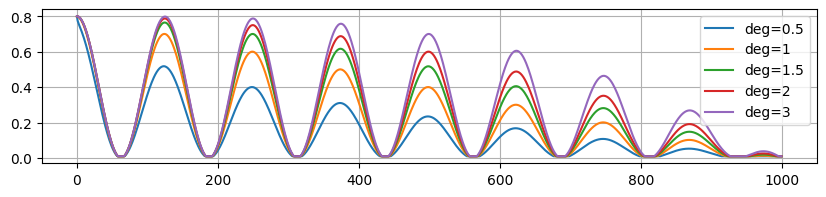

In [ ]:
# Función para instanciar un epsilon scheduler
def crear_eps_scheduler(val_inicial: float, val_min: float, n_ciclos: int, degree:int):
    """
    Retorna una función scheduler(progress) donde progress está en el rango [0..1]
    Oscila n_ciclos veces y la amplitud decae de acuerdo a degree, de 1 a 0, hasta producir un val_min
    """
    def scheduler(progress: float) -> float:
        # término de decaemiento: e.g., con degree=1 decae linealmente de val_inicial a val_min
        envelope = (1.0 - progress**degree)
        # término principal de oscilación
        cos_term = 0.5 * (1.0 + np.cos(2 * np.pi * n_ciclos * progress))
        # combinación de términos
        val = val_inicial * envelope * cos_term
        # asegurar el umbral con el valor mínimo
        return float(max(val, val_min))
    return scheduler

# Test: Visualizar valores del cosine scheduler
plt.figure(figsize=(10,2))
for deg in [0.5,1,1.5,2,3]:
  eps_scheduler = crear_eps_scheduler(0.8, 1e-2, 8, deg)
  plt.plot([eps_scheduler(p) for p in np.linspace(0,1,1000)], label=f"deg={deg}")
plt.legend()
plt.grid()
plt.show()

## Definición de Trainer

In [ ]:
from stable_baselines3.common.callbacks import CallbackList # Para combinar callbacks
from stable_baselines3.common.vec_env import VecMonitor # Para registrar datos episódicos con este cambio (CallbackList)

In [ ]:
class Trainer:
    """
    Clase que implementa los métodos de inicialización, entrenamiento,
    ploteo, evaluación y generación de video para el modelo.
    """
    def __init__(
        self, model_fn, mode=0, difficulty=0, total_timesteps=500_000, log_dir="./logs",
        eps_inicial=1.0, eps_min=1e-2, eps_n_ciclos=5, scheduler_degree=1,
        path_mejor_modelo=None, usar_media_guardar=True, ventana_para_media=100,

    ):
        # Parámetros del entorno y timesteps de entrenamiento
        self.mode = mode
        self.difficulty = difficulty
        self.total_timesteps = total_timesteps
        # Logging
        self.log_dir = log_dir
        os.makedirs(log_dir, exist_ok=True)

        # Crea el entorno Atari con envolturas necesarias
        env = make_atari_env(
            "ALE/BeamRider-v5",
            n_envs=1,
            seed=0,
            env_kwargs={"mode": self.mode, "difficulty": self.difficulty}
        )
        env = VecFrameStack(env, n_stack=4)
        env = VecMonitor(env, filename=os.path.join(log_dir, "monitor.csv"))
        self.env = env

        # Crea el modelo usando la función proporcionada
        self.model = model_fn(self.env)

        # Logger personalizado
        # new_logger = configure(log_dir, ["stdout", "csv", "tensorboard"])
        new_logger = configure(log_dir, ["csv", "tensorboard"])
        self.model.set_logger(new_logger)

        # Ruta por defecto para guardar el modelo
        if path_mejor_modelo is None:
            path_mejor_modelo = os.path.join("./", "best_model_so_far")

        # Epsilon Scheduler Callback
        scheduler = crear_eps_scheduler(val_inicial=eps_inicial, val_min=eps_min, n_ciclos=eps_n_ciclos, degree=scheduler_degree)
        eps_cb = EpsilonSchedulerCallback(lambda p: scheduler(p), total_timesteps=total_timesteps, verbose=1)

        # RewardLogger Callback
        rew_log_cb = RewardLoggerCallback(path_backup=path_mejor_modelo,
                                          usar_media=usar_media_guardar,
                                          ventana_para_media=ventana_para_media,
                                          verbose=1)

        # CallbackList para reward/logger y epsilon scheduler
        self.callback = CallbackList([rew_log_cb, eps_cb])

    # Entrenar el modelo + logging/backup con el callback, y guardar modelo final
    def train(self, path_final="model_final"):
        self.model.learn(total_timesteps=self.total_timesteps, log_interval=20, callback=self.callback)
        self.model.save(path_final)
        print("Training complete. Model saved.")

    # Graficar la evolución de las recompensas por episodio
    def plot_rewards(self):
        if not self.callback.callbacks[0].episode_rewards:
            print("No hay datos para plotear.")
            return
        plt.figure(figsize=(10, 5))
        plt.plot(self.callback.callbacks[0].episode_rewards, label="Episode Reward")
        plt.xlabel("Episodes")
        plt.ylabel("Reward")
        plt.title("Training Rewards Over Time")
        plt.grid()
        plt.legend()
        plt.tight_layout()
        plt.show()

    # Evaluación del modelo
    def evaluate(self, model_path: str = None, n_eval_episodes: int = 10, seed: int = 0):
        """
        Evalúa el modelo usando el mismo pipeline utilizado en el entrnamiento
        Si model_path es None, usa self.model (modelo actualmente en memoria).
        y retorna (mean_reward, std_reward)
        """
        # Cargar modelo (si se pasa un path)
        if model_path is not None:
            model = self.model.__class__.load(model_path)
        else:
            model = self.model

        # Crear entorno de evaluación con las mismas envolturas que en train()
        eval_env = make_atari_env(
            "ALE/BeamRider-v5",
            n_envs=1,
            seed=seed,
            env_kwargs={"mode": self.mode, "difficulty": self.difficulty},
        )
        eval_env = VecFrameStack(eval_env, n_stack=4)

        # Evaluar y reportar
        mean_reward, std_reward = evaluate_policy(
            model,
            eval_env,
            n_eval_episodes=n_eval_episodes,
            deterministic=False,
            render=False,
        )
        eval_env.close()
        print(f"[evaluate] mean_reward: {mean_reward:.2f} +/- {std_reward:.2f} over {n_eval_episodes} episodes")

        return mean_reward, std_reward

    # Generar video
    def generate_video(self, model_path: str = "DDQN_BeamRider_final", video_folder: str = "videos",
                      video_length: int = 5000, name_prefix: str = "ddqn-eval", seed: int = 0) -> str:

        os.makedirs(video_folder, exist_ok=True)
        model = self.model.__class__.load(model_path)

        # Crear env con los mismos wrappers (como en training)
        eval_env = make_atari_env(
            "ALE/BeamRider-v5",
            n_envs=1,
            seed=seed,
            env_kwargs={"mode": self.mode, "difficulty": self.difficulty},
        )
        eval_env = VecFrameStack(eval_env, n_stack=4)

        # Creación del recorder y grabar hasta agotar video_length
        recorder = VecVideoRecorder(
            eval_env,
            video_folder,
            record_video_trigger=lambda step: step == 0,
            video_length=video_length,
            name_prefix=name_prefix,
        )
        obs = recorder.reset()
        for _ in range(video_length): # video_length está en steps de la simulación
            action, _ = model.predict(obs, deterministic=True)
            obs, rewards, dones, infos = recorder.step(action)
        recorder.close()
        eval_env.close()

        # BUscar ficheros y generar video
        pattern = os.path.join(video_folder, f"{name_prefix}*.mp4")
        files = sorted(glob.glob(pattern), key=os.path.getmtime)
        video_path = files[-1]
        clear_output()
        print(f"[generate_video] Video guardado en: {video_path}")

        # Mostrar video
        try:
            video_bytes = open(video_path, "rb").read()
            video_b64 = base64.b64encode(video_bytes).decode("ascii")
            html = f"""
            <video width="500" height="500" controls>
              <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
            </video>

            """
            display(HTML(html))
            return video_path
        except Exception as e:
            raise RuntimeError(f"No se pudo mostrar el video: {e}")

## Definición del Algoritmo DDQN

Implementación adaptada del tutorial DDQN en: https://github.com/Stable-Baselines-Team/rl-colab-notebooks/blob/sb3/README.md

In [ ]:
import torch
from torch.nn import functional as F

In [ ]:
# Implementación DDQN
class DoubleDQN(DQN):
    """
    Clase basada en DQN que solo modifica el método de entrenamiento.
    """
    def train(self, gradient_steps: int, batch_size: int = 100) -> None:
        self.policy.set_training_mode(True)
        self._update_learning_rate(self.policy.optimizer) # LR Scheduler

        # Training loop
        losses = []
        for _ in range(gradient_steps): # Por defecto para DQN: gradient_steps=1
            # Muestreo del replay buffer
            replay_data = self.replay_buffer.sample(batch_size, env=self._vec_normalize_env)  # Observaciones normalizadas
            obs = replay_data.observations
            next_obs = replay_data.next_observations
            actions = replay_data.actions
            rewards = replay_data.rewards
            dones = replay_data.dones # (valores booleanos)

            # Normalizar formas -> Más adelante otras funciones usan índices con forma (batch, 1)
            if rewards.dim() == 1:
                rewards = rewards.unsqueeze(1) # de (batch,) a (batch,1)
            if dones.dim() == 1:
                dones = dones.unsqueeze(1)
            if actions.dim() == 1:
                actions = actions.unsqueeze(1)

            # Asegurar el device apropiado según inicialización
            device = self.device
            obs = obs.to(device)
            next_obs = next_obs.to(device)
            actions = actions.to(device)
            rewards = rewards.to(device).float()
            dones = dones.to(device).float()

            # Cálculo del DDQN target (desactivamos gradientes para self.q_net)
            with torch.no_grad():
                # En este bloque se reduce la sobreestimación
                # Q(s', a) para todas las acciones -> Selección maximizando con la red online
                q_next_online = self.q_net(next_obs)  # Forma: (batch, n_acciones)
                # a* = argmax_a Q_online(s', a)
                next_actions_online = q_next_online.argmax(dim=1, keepdim=True)  # Forma: (batch,1)

                # Q(s', a*) -> Evaluación con la red target
                q_next_target = self.q_net_target(next_obs)
                q_next_target_selected = torch.gather(q_next_target, dim=1, index=next_actions_online)  # (batch,1)

                # 1-step TD target, (1 - done) = 0 cuando el siguiente estado es terminal
                target_q_values = rewards + (1.0 - dones) * (self.gamma * q_next_target_selected)

            # Estimativos para Q de la red online
            q_values_all = self.q_net(obs)  # (batch, n_acciones)
            current_q_values = torch.gather(q_values_all, dim=1, index=actions.long())  # (batch,1)

            # Check: Las formas deben coincidir
            assert current_q_values.shape == target_q_values.shape, (
                f"shapes mismatch: {current_q_values.shape} vs {target_q_values.shape}"
            )

            # Pérdida y Optmización
            # loss = F.smooth_l1_loss(current_q_values, target_q_values)
            loss = F.huber_loss(current_q_values, target_q_values) # f de pérdida más robusta frente a outliers
            losses.append(loss.item())
            self.policy.optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(self.policy.parameters(), self.max_grad_norm) # Gradient clipping
            self.policy.optimizer.step()

        # Logging
        self._n_updates += gradient_steps # para saber cuándo actualizar o registrar logs
        self.logger.record("train/n_updates", self._n_updates, exclude="tensorboard") # evita duplicados con tensorboard
        self.logger.record("train/loss", np.mean(losses)) # pérdida promedio

## Entrenamiento

Definición de hiperparámetros

In [ ]:
# Ciclos de oscillación para eps y lr
N_CICLOS=15

# Constructor DDQN
def create_model(env):
    return DoubleDQN(
        "CnnPolicy",
        env,
        learning_rate=5e-5,
        buffer_size=250_000,
        learning_starts=25_000, # 1 -> si se va a usar lr_scheduler
        batch_size=64,
        gradient_steps=1,
        gamma=0.99,
        train_freq=4,
        target_update_interval=10_000,
        # exploration_initial_eps=1.00, # Estos hiperparámetros se controlan con el eps scheduler
        # exploration_fraction=1,
        # exploration_final_eps=0.25,
        policy_kwargs=dict(net_arch=[256]),
        tensorboard_log="./logs",
        verbose=1,
    )

In [ ]:
trainerDDQN = Trainer(model_fn=create_model, mode=0, difficulty=0, total_timesteps=5_000_000,
                      eps_inicial=0.65, eps_min=0.01, eps_n_ciclos=N_CICLOS, scheduler_degree=2)

  warnings.warn(



Using cuda device
Wrapping the env in a VecTransposeImage.


  return datetime.utcnow().replace(tzinfo=utc)



Entrenamiento

In [ ]:
%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir ./logs

<IPython.core.display.Javascript object>

  return datetime.utcnow().replace(tzinfo=utc)



In [ ]:
trainerDDQN.train(path_final="DDQN_BeamRider_final")

[EpsilonScheduler] timestep=1 progress=0.0000 epsilon=0.65000 lr: 0.00005
[RewardLoggerCallback] Nuevo mejor score 3.00 -> Guardado en: ./best_model_so_far.zip
[RewardLoggerCallback] Nuevo mejor score 3.14 -> Guardado en: ./best_model_so_far.zip
[EpsilonScheduler] timestep=5001 progress=0.0010 epsilon=0.64856 lr: 0.00005
[EpsilonScheduler] timestep=10001 progress=0.0020 epsilon=0.64424 lr: 0.00005
[EpsilonScheduler] timestep=15001 progress=0.0030 epsilon=0.63709 lr: 0.00005
[EpsilonScheduler] timestep=20001 progress=0.0040 epsilon=0.62717 lr: 0.00005
[EpsilonScheduler] timestep=25001 progress=0.0050 epsilon=0.61456 lr: 0.00005
[EpsilonScheduler] timestep=30001 progress=0.0060 epsilon=0.59938 lr: 0.00005
[EpsilonScheduler] timestep=35001 progress=0.0070 epsilon=0.58177 lr: 0.00005
[EpsilonScheduler] timestep=40001 progress=0.0080 epsilon=0.56187 lr: 0.00005
[EpsilonScheduler] timestep=45001 progress=0.0090 epsilon=0.53988 lr: 0.00005
[EpsilonScheduler] timestep=50001 progress=0.0100 eps

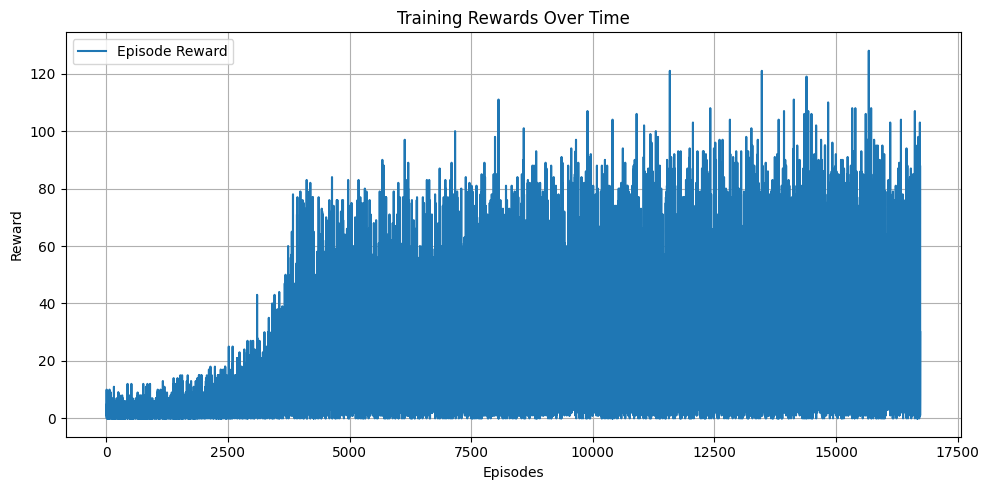

In [ ]:
trainerDDQN.plot_rewards()

## Evaluación del modelo

In [ ]:
mean, std = trainerDDQN.evaluate(model_path="./best_model_so_far", n_eval_episodes=10)

[evaluate] mean_reward: 6843.20 +/- 1239.76 over 10 episodes


In [ ]:
mean, std = trainerDDQN.evaluate(model_path="./DDQN_BeamRider_final", n_eval_episodes=10)

[evaluate] mean_reward: 4324.20 +/- 1725.61 over 10 episodes


## Videos

In [ ]:
trainerDDQN.generate_video("./best_model_so_far", video_length=5000)

[generate_video] Video guardado en: videos/ddqn-eval-step-0-to-step-5000.mp4


'videos/ddqn-eval-step-0-to-step-5000.mp4'

In [ ]:
trainerDDQN.generate_video("./DDQN_BeamRider_final", video_length=5000)

[generate_video] Video guardado en: videos/ddqn-eval-step-0-to-step-5000.mp4


'videos/ddqn-eval-step-0-to-step-5000.mp4'

# Referencias

[1] Gym Docs BeamRider https://ale.farama.org/environments/beam_rider/

[2] Stable Baselines3 Documentation, DQN. https://stable-baselines3.readthedocs.io/en/master/modules/dqn.htm

[3] SB3 Colab Notebooks https://github.com/Stable-Baselines-Team/rl-colab-notebooks/blob/sb3/README.md

[4] Cosine Annealing con Restarts https://docs.pytorch.org/docs/stable/generated/torch.optim.lr_scheduler.CosineAnnealingWarmRestarts.html
